# Global Wheat Detection
## Problem Overview:
Open up your pantry and you’re likely to find several wheat products. Indeed, your morning toast or cereal may rely upon this common grain. Its popularity as a food and crop makes wheat widely studied. To get large and accurate data about wheat fields worldwide, plant scientists use image detection of "wheat heads"—spikes atop the plant containing grain. These images are used to estimate the density and size of wheat heads in different varieties. Farmers can use the data to assess health and maturity when making management decisions in their fields.

However, accurate wheat head detection in outdoor field images can be visually challenging. There is often overlap of dense wheat plants, and the wind can blur the photographs. Both make it difficult to identify single heads. Additionally, appearances vary due to maturity, color, genotype, and head orientation. Finally, because wheat is grown worldwide, different varieties, planting densities, patterns, and field conditions must be considered. Models developed for wheat phenotyping need to generalize between different growing environments. Current detection methods involve one- and two-stage detectors (Yolo-V3 and Faster-RCNN), but even when trained with a large dataset, a bias to the training region remains.

The Global Wheat Head Dataset is led by nine research institutes from seven countries: the University of Tokyo, Institut national de recherche pour l’agriculture, l’alimentation et l’environnement, Arvalis, ETHZ, University of Saskatchewan, University of Queensland, Nanjing Agricultural University, and Rothamsted Research. These institutions are joined by many in their pursuit of accurate wheat head detection, including the Global Institute for Food Security, DigitAg, Kubota, and Hiphen.

In this competition, you’ll detect wheat heads from outdoor images of wheat plants, including wheat datasets from around the globe. Using worldwide data, you will focus on a generalized solution to estimate the number and size of wheat heads. To better gauge the performance for unseen genotypes, environments, and observational conditions, the training dataset covers multiple regions. You will use more than 3,000 images from Europe (France, UK, Switzerland) and North America (Canada). The test data includes about 1,000 images from Australia, Japan, and China.

Wheat is a staple across the globe, which is why this competition must account for different growing conditions. Models developed for wheat phenotyping need to be able to generalize between environments. If successful, researchers can accurately estimate the density and size of wheat heads in different varieties. With improved detection farmers can better assess their crops, ultimately bringing cereal, toast, and other favorite dishes to your table. 

# Data
More details on the data acquisition and processes are available at https://www.kaggle.com/c/global-wheat-detection/data

Data Format: The data is images of wheat fields, with bounding boxes for each identified wheat head. Not all images include wheat heads / bounding boxes. The images were recorded in many locations around the world.

The CSV data is simple - the image ID matches up with the filename of a given image, and the width and height of the image are included, along with a bounding box. There is a row in train.csv for each bounding box. Not all images have bounding boxes.

**Goal:** The goal is to predict bounding boxes around each wheat head in images that have them. If there are no wheat heads, you must predict no bounding boxes.

**File Structure:**

* train.csv - the training data
* sample_submission.csv - a sample submission file in the correct format
* train.zip - training images
* test.zip - test images

**Fields in csv:**

* image_id - the unique image ID
* width, height - the width and height of the images
* bbox - a bounding box, formatted as a Python-style list of [xmin, ymin, width, height].

## Posing this as a Deep Learning porblem.

* We have images and their corresponding bounding boxes in the data.
* Given these 2 as input to the model we need to precit the bounding boxes around each wheat head in a given image from the test data.
* This prediction involves object detection in the images and plotting bounding boxes around it.
* we can use techniques like Faster RCNN or Yolo v3 to do these tasks.


## Metics:

* This competition is evaluated on the mean average precision at different intersection over union (IoU) thresholds. The IoU of a set of predicted bounding boxes and ground truth bounding boxes is calculated as:
                           
<img src="IoU.png">

In [1]:
import os
import pandas as pd
import numpy as np

from glob import glob
from PIL import Image
import cv2

# import data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

from ast import literal_eval

In [2]:
train_dir = 'input/train/'
test_dir = 'input/test/'

# Glob the directories and get the lists of train and test images
train_path = glob(train_dir + '*')
test_path = glob(test_dir + '*')

print('Number of train images are :', len(os.listdir(train_dir)))
print('Number of test  images are :', len(os.listdir(test_dir)))

Number of train images are : 3422
Number of test  images are : 10


### Observations:
* We have 3422 input images which are low for training a deep neural network. In this problem data augmentation and transfer learning techniques can be used.
* Test dataset contains only 10 images which is also very low.

In [3]:
train_data = pd.read_csv('input/train.csv')

print('Shape of train data: ',train_data.shape)

print(train_data.head())

Shape of train data:  (147793, 5)
    image_id  width  height                         bbox   source
0  b6ab77fd7   1024    1024   [834.0, 222.0, 56.0, 36.0]  usask_1
1  b6ab77fd7   1024    1024  [226.0, 548.0, 130.0, 58.0]  usask_1
2  b6ab77fd7   1024    1024  [377.0, 504.0, 74.0, 160.0]  usask_1
3  b6ab77fd7   1024    1024  [834.0, 95.0, 109.0, 107.0]  usask_1
4  b6ab77fd7   1024    1024  [26.0, 144.0, 124.0, 117.0]  usask_1


* Each row cosists of an image id, shape of image,Bbox and source details
* Bbox details are given in a list of elements, so we need to seperate them in diffenret columns for better use.
* Have to do sanity check on image shapes and then have to see how many images given per source and observe how the images changes according to the source.
* There are total of 147793 rows, which implies that each images contains multiple bounding boxes as we olny have 3422 images in total.

### Basic Sanity check

In [4]:
def grader_1(train_df):
    if (train_data['width'].unique() == train_data['height'].unique() == [1024]):
        print('All train images given are of shape 1024x1024')
    else:
        print('Not all train images are of same shape')
grader_1(train_data)

All train images given are of shape 1024x1024


In [5]:
train_images = pd.DataFrame([i.split('/')[-1][6:-4] for i in train_path])
train_images.columns = ['image_id']

train_images.head()
#Merging on image_id column to get sorted list of images_id according to the images that we have in the path directory.
train_images = train_images.merge(train_data, on='image_id', how='left')

print(train_images.head())
# replace nan values with zeros
train_images['bbox'] = train_images.bbox.fillna('[0,0,0,0]')

# split bbox column
bbox_items = train_images.bbox.str.split(',', expand=True)
print(train_images.bbox)
train_images['bbox_xmin'] = bbox_items[0].str.strip('[ ').astype(float)
train_images['bbox_ymin'] = bbox_items[1].str.strip(' ').astype(float)
train_images['bbox_width'] = bbox_items[2].str.strip(' ').astype(float)
train_images['bbox_height'] = bbox_items[3].str.strip(' ]').astype(float)

print(train_images.head())

    image_id   width  height               bbox     source
0  00333207f  1024.0  1024.0  [0, 654, 37, 111]  arvalis_1
1  00333207f  1024.0  1024.0  [0, 817, 135, 98]  arvalis_1
2  00333207f  1024.0  1024.0   [0, 192, 22, 81]  arvalis_1
3  00333207f  1024.0  1024.0   [4, 342, 63, 38]  arvalis_1
4  00333207f  1024.0  1024.0  [82, 334, 82, 81]  arvalis_1
0                  [0, 654, 37, 111]
1                  [0, 817, 135, 98]
2                   [0, 192, 22, 81]
3                   [4, 342, 63, 38]
4                  [82, 334, 82, 81]
                     ...            
147837    [946.0, 419.0, 74.0, 69.0]
147838    [897.0, 647.0, 59.0, 56.0]
147839    [490.0, 912.0, 62.0, 81.0]
147840    [179.0, 343.0, 66.0, 96.0]
147841    [200.0, 743.0, 79.0, 52.0]
Name: bbox, Length: 147842, dtype: object
    image_id   width  height               bbox     source  bbox_xmin  \
0  00333207f  1024.0  1024.0  [0, 654, 37, 111]  arvalis_1        0.0   
1  00333207f  1024.0  1024.0  [0, 817, 135, 98]  ar

In [6]:
train_images.columns

Index(['image_id', 'width', 'height', 'bbox', 'source', 'bbox_xmin',
       'bbox_ymin', 'bbox_width', 'bbox_height'],
      dtype='object')

In [7]:
print('Images with no wheat heads: ', len(train_images)-len(train_data))

Images with no wheat heads:  49


### Observations:
* We have created a dataframe of image_id of all the train images and merged it with the train dataframe so that all the images along with their bounding boxes in ordered fashion.
* Filled the bounding box values with [0, 0, 0, 0] for the images with no bounding boxes.
* There are 49 images with no wheat heads.

In [8]:
def get_bbox_area(bbox):
    bbox = literal_eval(bbox)
    return bbox[2] * bbox[3]

train_images['bbox_area'] = train_images['bbox'].apply(get_bbox_area)
train_images.drop(['bbox'],axis=1,inplace=True)    

## Plotting histogram of areas of bounding boxes

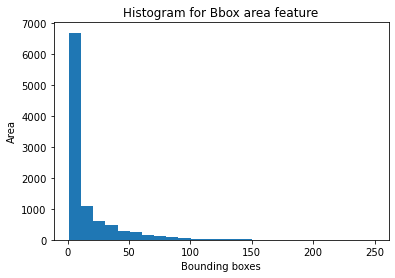

In [9]:
plt.hist(train_images['bbox_area'].value_counts(),bins=25)
plt.title('Histogram for Bbox area feature')
plt.xlabel('Bounding boxes')
plt.ylabel('Area')
plt.show()

In [10]:
train_images['bbox_area'].max()

529788.0

### Observations:
* Some of the images contains multiple bounding boxes and some of the images does not even contain any bounding boxes.
* Maximum area of bounding boxes is 529788.0

### EDA on Sources of Images

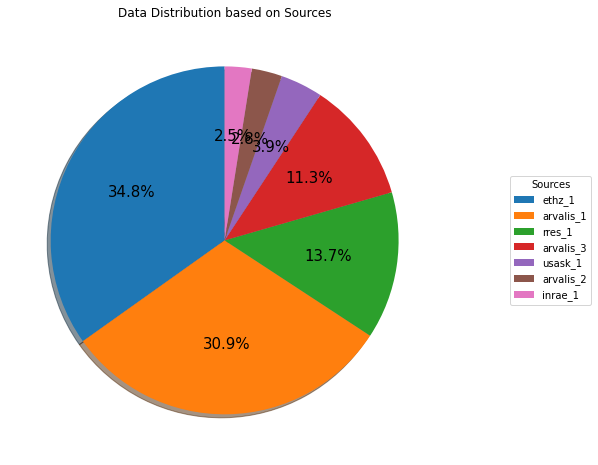

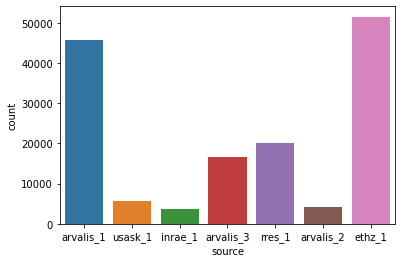

In [11]:
#Reference : https://matplotlib.org/3.1.1/gallery/pie_and_polar_charts/pie_and_donut_labels.html#sphx-glr-gallery-pie-and-polar-charts-pie-and-donut-labels-py

counts = dict(train_images['source'].value_counts())

fig , ax = plt.subplots(figsize=(8,8))

wedges, texts, autotexts = ax.pie(list(counts.values()), autopct='%1.1f%%',shadow=True, startangle=90);
ax.legend(wedges, list(counts.keys()),
          title="Sources",
          loc="center",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.setp(autotexts, size=15);

ax.set_title("Data Distribution based on Sources");
plt.show();
sns.countplot(x='source', data=train_images);


### Observations:
* Images came from different sources and each source has different number of images.
* Most of the images are produced by sources aravalis_1 & ethz_1.
* Out of 7 image sources most of the images came from 4 sources and small amount of images are from 3 sources.

### EDA on building boxes

In [12]:
print('Number of unique images are: ',len(train_images['image_id'].unique()))

Number of unique images are:  3422


## Histogram of number of bounding boxes

Text(0, 0.5, 'Images')

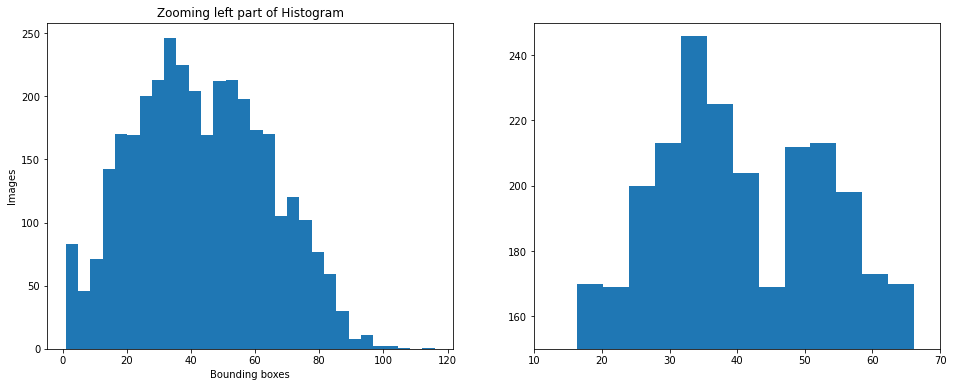

In [13]:
fig, (plt1, plt2) = plt.subplots(1,2)
fig.set_size_inches(16,6)

plt1.hist(train_images['image_id'].value_counts(),bins=30)
plt1.set_title('Number of bounding boxes per Image')
plt1.set_xlabel('Bounding boxes')
plt1.set_ylabel('Images')

plt2.hist(train_images['image_id'].value_counts(),bins=30)
plt2.set_xlim(10,70)
plt2.set_ylim(150,250)
plt1.set_title('Zooming left part of Histogram')
plt1.set_xlabel('Bounding boxes')
plt1.set_ylabel('Images')


### Observations:
* Most of the images have 20 to 50 bounding boxes.
* Maximum nouber of bounding boxes is 116.
* There are very few images having more than 90 bounding boxes.

### Plotting some images with bounding boxes

In [14]:
def get_all_bboxes(data,image_id):
    image_boxes = data[data['image_id'] == image_id]
    bboxes = []
    for _,row in image_boxes.iterrows():
        bboxes.append((row.bbox_xmin, row.bbox_ymin, row.bbox_width , row.bbox_height))
    return bboxes

def plot_random_image(data, rows=3,cols=3):
    fig, ax = plt.subplots(rows, cols,figsize=(12,12))
    for row in range(rows):
        for col in range(cols):
            index = index = np.random.randint(len(data),size=1)[0]
            img_id = data.iloc[index]['image_id']
            img = Image.open(train_dir + img_id + '.jpg')
            ax[row,col].imshow(img)
            #Get all bboxes of image
            bboxes = get_all_bboxes(data, img_id)
            #Plotting all bboxes
            for bbox in bboxes:
                add_box = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor=None,fill=False)
                ax[row, col].add_patch(add_box)
            #ax[row, col].axis('off')

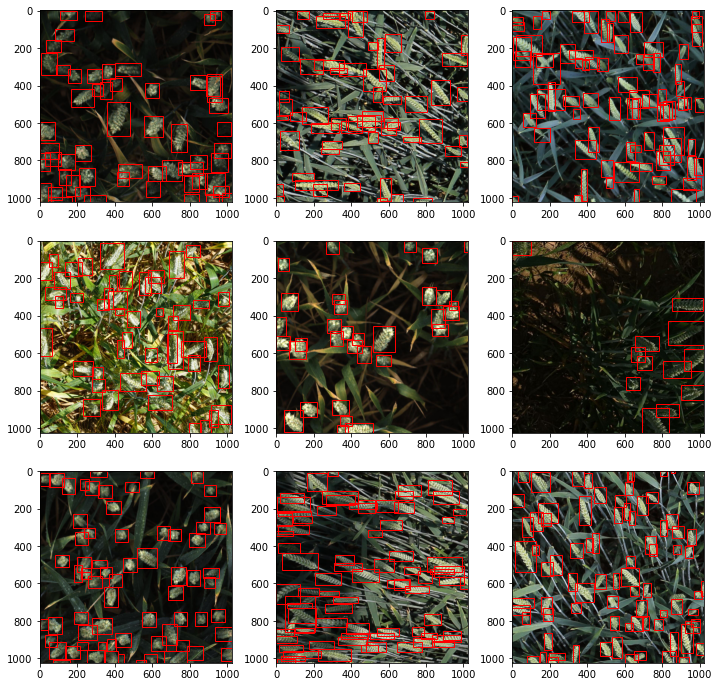

In [15]:
plot_random_image(train_images)

### Observations:
* There are numerous amount of bounding boxes per image.
* Some images have fewer bounding boxes also.
* We can also observe that these images are taken in different lightning conditions and various plant maturity stages.

### Visualizing images by Source

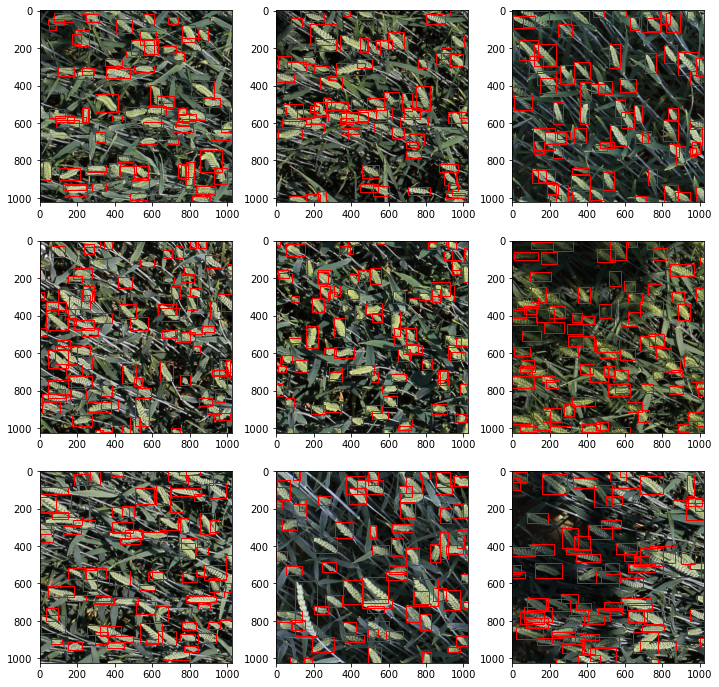

In [16]:
plot_random_image(train_images[train_images['source']=='ethz_1'])

* Most of the images from source ethz_1 have large no of bounding boxes i.e. Density of wheat heads is more in these images

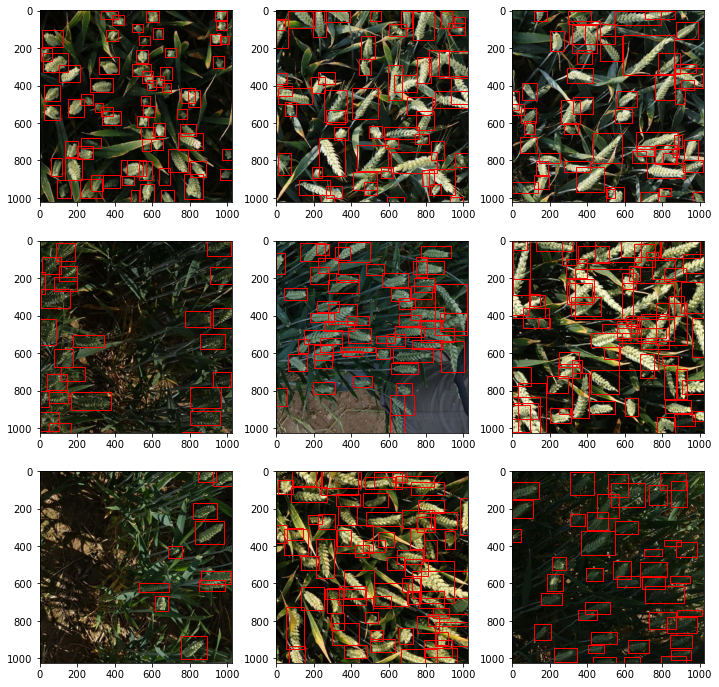

In [17]:
plot_random_image(train_images[train_images['source']=='arvalis_3'])

* Images from source arvalis_3 have low to high number of bounding boxes.
* Some of the images have lot of background data and very minimal bounding boxes.

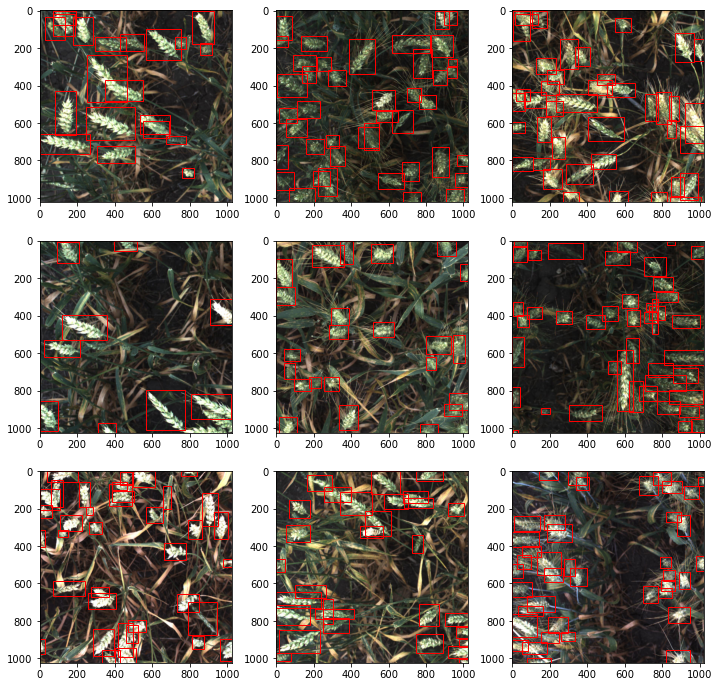

In [18]:
plot_random_image(train_images[train_images['source']=='usask_1'])

* Images from source usask_1 have average number of bounding boxes.

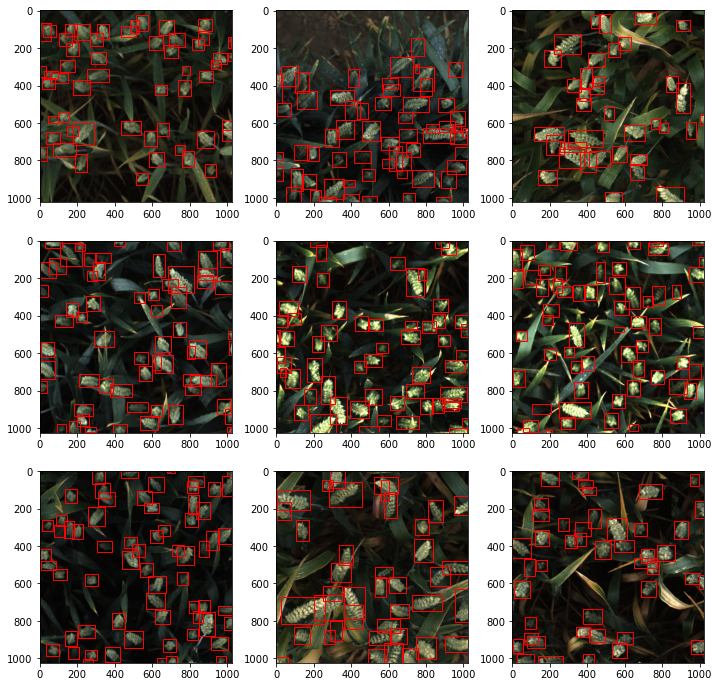

In [19]:
plot_random_image(train_images[train_images['source']=='rres_1'])

* Some images from sources rres_1 have low wheat heads and some of them have large wheat heads

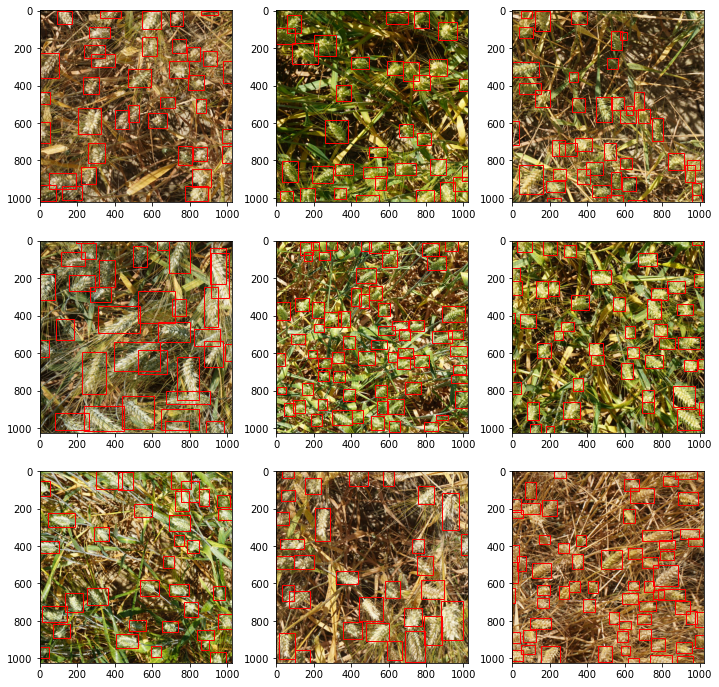

In [20]:
plot_random_image(train_images[train_images['source']=='arvalis_1'])

* Images from source aravalis_1 have large number of wheat heads.
* Colour of most of the wheat heads is yellow.

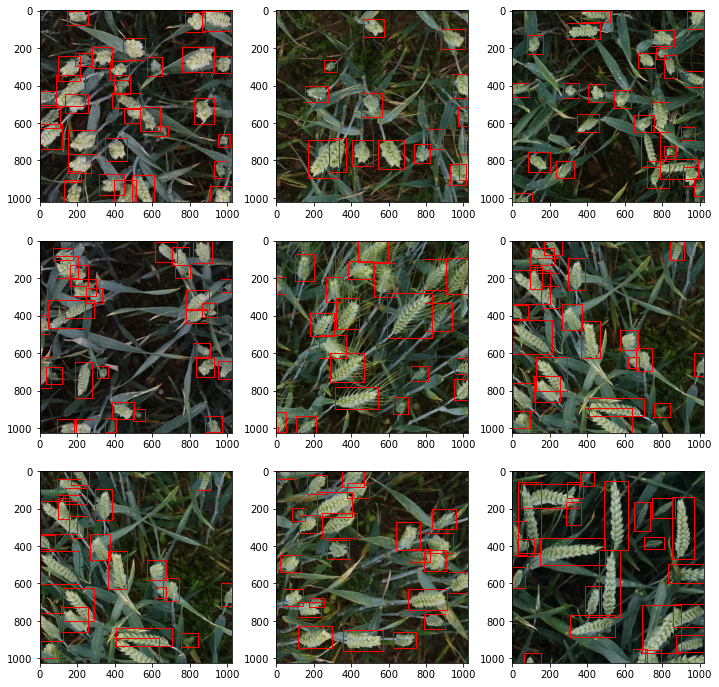

In [21]:
plot_random_image(train_images[train_images['source']=='inrae_1'])

* Images from source inrae_1 have low number of wheat heads.
* Most of the images contains leaves of crops.

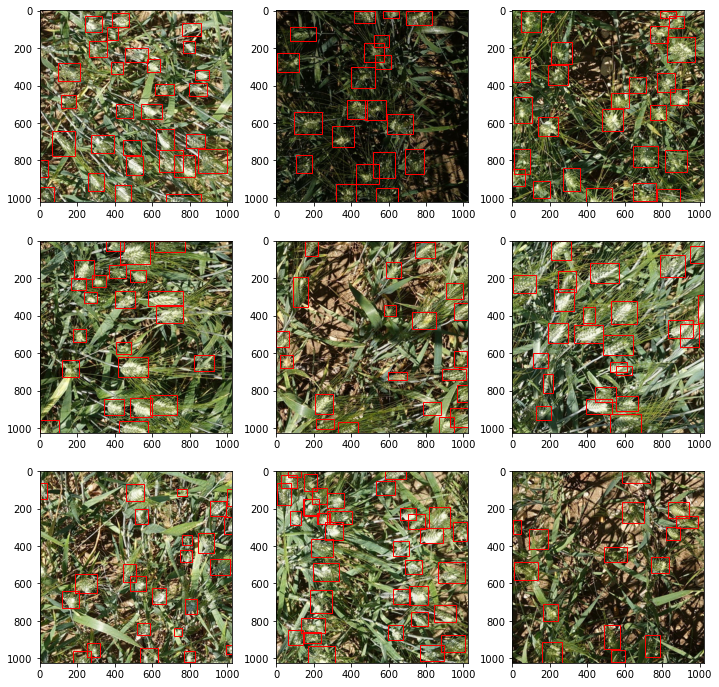

In [22]:
plot_random_image(train_images[train_images['source']=='arvalis_2'])

* Images from source arvalis_2 have average number of wheat heads.

### Visualizing images with no wheat heads

In [23]:
train_images['source'] = train_images['source'] .fillna('No Source')

print('Number of images with no wheat heads: ',train_images[train_images['source']=='No Source'].shape[0])

Number of images with no wheat heads:  49


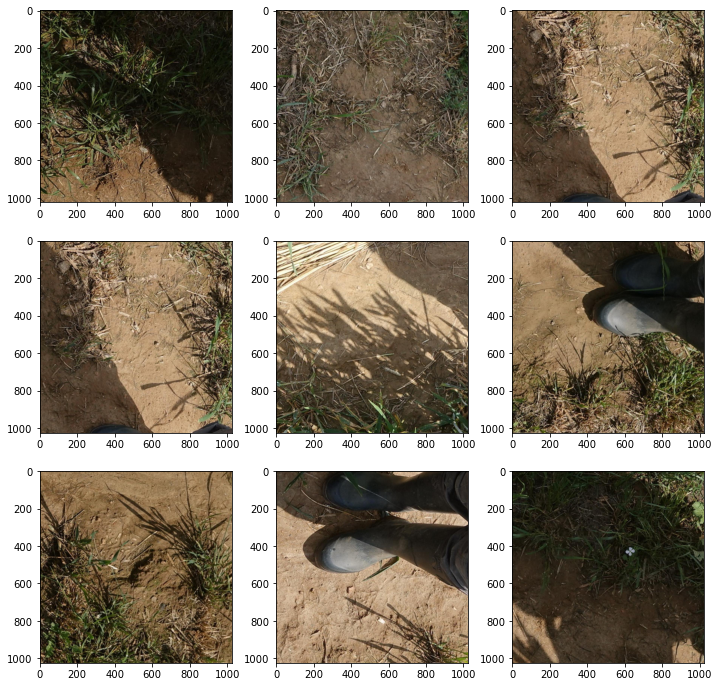

In [24]:
plot_random_image(train_images[train_images['source']== 'No Source']);

* Some of the images does not have any wheat heads.
* There are total 49 such images with no wheat heads.

### Visualizing images based on size of bounding boxes

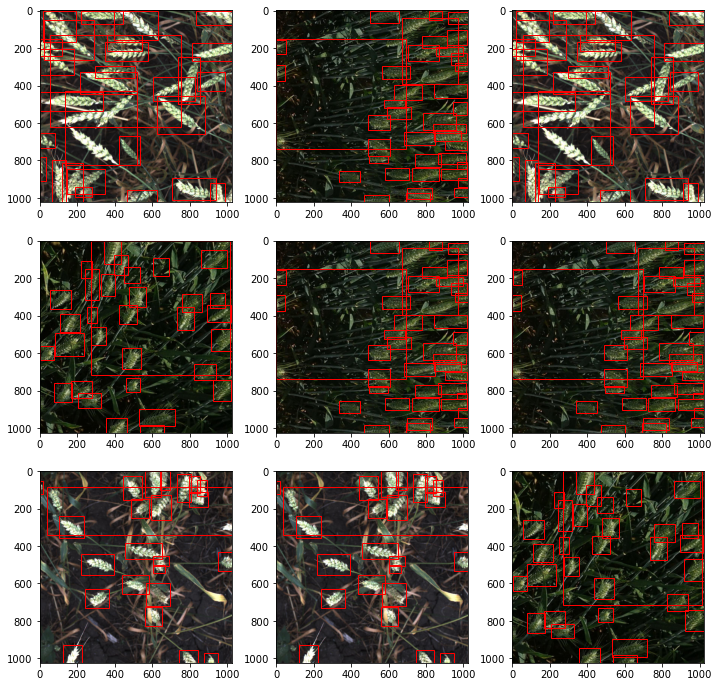

In [25]:
large_box_images = train_images[train_images['bbox_area']>250000]['image_id']
plot_random_image(train_images[train_images['image_id'].isin(large_box_images)])

* There are large bounding boxes but most of such images contains less or no wheat heads,

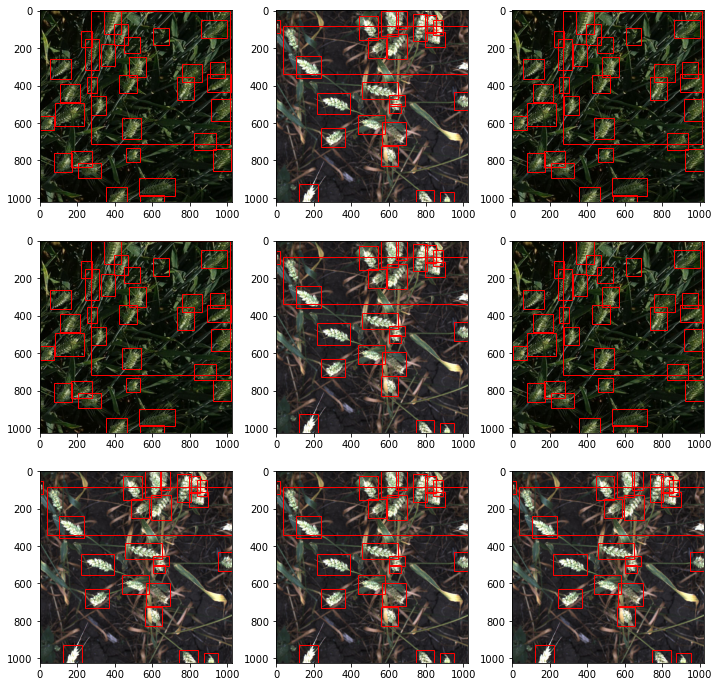

In [26]:
small_box_images = train_images[(train_images['bbox_area']>0)&(train_images['bbox_area']>100)]['image_id']
plot_random_image(train_images[train_images['image_id'].isin(large_box_images)])

* Most of the images with small bounding boxes has more wheat heads.

## Observations:

* Each type of source has specific types of wheat images. This is probably dependent on the region of data collection and time of the year when the particular data was collected.
* There are some images with no bounding boxes at all.
* Count of bounding boxes will vary from a min of 1 to max of 116.
* Most of the images conatin an average of 20 to 60 bounding boxes.
* Images given are taken from different lighting conditions at differen plant growth level.